In [ ]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 778.7/778.7 kB 15.4 MB/s eta 0:00:00a 0:00:01


In [2]:
!pip install roboflow
# Downloading Data from Roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="OOyWBqn0iuiGkDwDDKDV")
project = rf.workspace("ritesh-aqame").project("segmentation-12dac")
version = project.version(2)
dataset = version.download("yolov8")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.5/75.5 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 35.8 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cycler-0.12.1:
      Successfully uninstalled cycler-0.12.1
  Attempting uninstall: certifi
    Found existing installation: certifi 20


Extracting Dataset Version Zip to Segmentation-2 in yolov8:: 100%|██████████| 802/802 [00:00<00:00, 6222.75it/s]


In [3]:
#For better visualization of model learning using wandb
!pip install wandb
import wandb
wandb.login(key="32c0e2c48d2843dba56832316dd12907c726e952")

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

# Let's start with nano model of Yolo for fine tuning

In [5]:
from ultralytics import YOLO
from PIL import Image
model=YOLO("yolov8n-seg.pt")

100%|██████████| 6.73M/6.73M [00:00<00:00, 77.4MB/s]


In [6]:
%cd /kaggle/working/Segmentation-2

/kaggle/working/Segmentation-2


In [7]:
!ls

README.dataset.txt  README.roboflow.txt  data.yaml  test  train  valid


In [8]:
import yaml

# Load the YAML file and Change the path of it accordingly
with open('data.yaml', 'r') as file:
    data = yaml.safe_load(file)

data['test'] = '/kaggle/working/Segmentation-2/test/images'
data['train'] = '/kaggle/working/Segmentation-2/train/images'
data['val'] = '/kaggle/working/Segmentation-2/valid/images'

# Save the modified data back to the YAML file
with open('data.yaml', 'w') as file:
    yaml.dump(data, file)

In [11]:
results = model.train(data='/kaggle/working/Segmentation-2/data.yaml',
                      device=[0,1], 
                      epochs=60,
                      imgsz=640,
                      workers=10,
                      batch=16,
                      patience=15,
                      single_cls=True,
                      optimizer='AdamW',
                      dropout=0.2,
                      name="Boat_Segmentation_S")

Ultralytics YOLOv8.2.24 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
                                                      CUDA:1 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/kaggle/working/Segmentation-2/data.yaml, epochs=60, time=None, patience=15, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=[0, 1], workers=10, project=None, name=Boat_Segmentation_S, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=True, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=Fals

100%|██████████| 755k/755k [00:00<00:00, 14.8MB/s]
2024-05-28 15:15:43,160	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-05-28 15:15:44,213	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 6.73M/6.73M [00:00<00:00, 79.1MB/s]


TensorBoard: Start with 'tensorboard --logdir runs/segment/Boat_Segmentation_S', view at http://localhost:6006/


wandb: Currently logged in as: riteshkr142092111. Use `wandb login --relogin` to force relogin
wandb: wandb version 0.17.0 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
wandb: Tracking run with wandb version 0.16.6
wandb: Run data is saved locally in /kaggle/working/Segmentation-2/wandb/run-20240528_151605-fjqtvydq
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run Boat_Segmentation_S
wandb: ⭐️ View project at https://wandb.ai/riteshkr142092111/YOLOv8
wandb: 🚀 View run at https://wandb.ai/riteshkr142092111/YOLOv8/runs/fjqtvydq


Overriding model.yaml nc=80 with nc=1
Transferred 381/417 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 72.7MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/Segmentation-2/train/labels... 357 images, 0 backgrounds, 0 corrupt: 100%|██████████| 357/357 [00:00<00:00, 1026.20it/s]


train: New cache created: /kaggle/working/Segmentation-2/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
val: New cache created: /kaggle/working/Segmentation-2/valid/labels.cache


val: Scanning /kaggle/working/Segmentation-2/valid/labels... 22 images, 0 backgrounds, 0 corrupt: 100%|██████████| 22/22 [00:00<00:00, 695.96it/s]


Plotting labels to runs/segment/Boat_Segmentation_S/labels.jpg... 
optimizer: AdamW(lr=0.01, momentum=0.937) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/segment/Boat_Segmentation_S
Starting training for 60 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/60      1.58G      1.473      3.434      2.413      1.478          8        640: 100%|██████████| 23/23 [00:09<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.70it/s]


                   all         22         32     0.0207      0.219     0.0159    0.00287        0.5     0.0312     0.0236    0.00466

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/60      1.63G      1.691      2.759      1.581      1.641          7        640: 100%|██████████| 23/23 [00:05<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.65it/s]


                   all         22         32     0.0042      0.625    0.00594     0.0017    0.00021     0.0312   0.000485   4.85e-05

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/60      1.57G      1.674      2.696      1.546      1.557          8        640: 100%|██████████| 23/23 [00:04<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.46it/s]


                   all         22         32    0.00524      0.812    0.00666    0.00158   0.000426     0.0625   0.000357   3.57e-05

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/60      1.56G       1.55      2.536      1.313       1.51          7        640: 100%|██████████| 23/23 [00:04<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.50it/s]


                   all         22         32    0.00649      0.812    0.00574     0.0021    0.00055     0.0625   0.000177    2.6e-05

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/60      1.64G      1.451      2.315      1.219      1.462         12        640: 100%|██████████| 23/23 [00:04<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.68it/s]


                   all         22         32    0.00667      0.844    0.00626    0.00195    0.00635      0.469    0.00417   0.000963

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/60      1.65G      1.442      2.246      1.211      1.451         14        640: 100%|██████████| 23/23 [00:05<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.74it/s]


                   all         22         32      0.165      0.375      0.117     0.0552       0.11       0.25     0.0578     0.0213

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/60      1.62G      1.417      2.276      1.107      1.372          8        640: 100%|██████████| 23/23 [00:04<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.10it/s]


                   all         22         32      0.173      0.562        0.4      0.248      0.164      0.531      0.374      0.168

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/60      1.67G      1.365      2.196      1.063      1.358          8        640: 100%|██████████| 23/23 [00:04<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.84it/s]


                   all         22         32      0.314      0.375      0.295       0.17      0.286      0.344      0.226     0.0916

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/60      1.55G      1.291      2.206      1.009      1.308          5        640: 100%|██████████| 23/23 [00:04<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.17it/s]


                   all         22         32      0.626      0.783       0.65      0.408      0.626      0.783      0.655      0.359

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/60      1.55G      1.221      2.127     0.9606      1.272          4        640: 100%|██████████| 23/23 [00:04<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.94it/s]


                   all         22         32      0.592      0.906      0.766      0.518      0.619      0.916      0.741      0.457

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/60      1.63G       1.28      2.111     0.9929      1.286          4        640: 100%|██████████| 23/23 [00:05<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.77it/s]


                   all         22         32      0.626       0.75      0.736      0.487      0.645      0.781      0.763      0.466

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/60      1.53G      1.209      1.994     0.9029      1.228         10        640: 100%|██████████| 23/23 [00:04<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.95it/s]


                   all         22         32      0.947      0.844      0.936      0.656      0.912      0.812      0.909      0.635

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/60      1.58G       1.28      2.109      0.932      1.278          7        640: 100%|██████████| 23/23 [00:04<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.08it/s]


                   all         22         32      0.913      0.812      0.929      0.689      0.913      0.812      0.923      0.693

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/60      1.54G      1.164      1.991     0.8377      1.214          8        640: 100%|██████████| 23/23 [00:04<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.30it/s]


                   all         22         32      0.713      0.812      0.824      0.617      0.713      0.812      0.824      0.575

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/60      1.65G      1.204      2.064     0.8366      1.206         12        640: 100%|██████████| 23/23 [00:04<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.69it/s]


                   all         22         32      0.741      0.804      0.868      0.656      0.741      0.804      0.868      0.607

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/60      1.64G      1.173      2.036     0.8992      1.236          4        640: 100%|██████████| 23/23 [00:04<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.35it/s]


                   all         22         32      0.892      0.656      0.842      0.612      0.892      0.656      0.842      0.609

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/60      1.59G       1.22      2.123     0.8801      1.235          6        640: 100%|██████████| 23/23 [00:04<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.16it/s]


                   all         22         32      0.837      0.656      0.836      0.623      0.837      0.656      0.836      0.575

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/60       1.5G      1.148      2.059     0.8085      1.185          5        640: 100%|██████████| 23/23 [00:04<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.97it/s]


                   all         22         32       0.77      0.941      0.932      0.747       0.77      0.941      0.932      0.638

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/60      1.65G      1.109      1.974     0.7878      1.227          8        640: 100%|██████████| 23/23 [00:04<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.07it/s]


                   all         22         32      0.938      0.875      0.946      0.718      0.938      0.875      0.946      0.674

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/60      1.54G      1.084       1.88     0.7513      1.168          8        640: 100%|██████████| 23/23 [00:04<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.18it/s]


                   all         22         32      0.954      0.906      0.979      0.739      0.954      0.906      0.979       0.73

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/60      1.64G      1.126      1.946     0.7616      1.186          6        640: 100%|██████████| 23/23 [00:04<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.13it/s]


                   all         22         32      0.956      0.938      0.983      0.776      0.956      0.938      0.983      0.722

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/60      1.63G      1.057      1.917     0.7809      1.161         15        640: 100%|██████████| 23/23 [00:05<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.87it/s]


                   all         22         32       0.83          1      0.959      0.748       0.83          1      0.959      0.723

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/60      1.63G      1.093      1.901     0.7397      1.177          5        640: 100%|██████████| 23/23 [00:04<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.92it/s]


                   all         22         32      0.968      0.941      0.985      0.787      0.968      0.941      0.985      0.753

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/60      1.64G       1.03      1.829     0.7199      1.131          5        640: 100%|██████████| 23/23 [00:04<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.18it/s]


                   all         22         32      0.941      0.844      0.953      0.744      0.941      0.844      0.953      0.738

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/60      1.63G      1.103       1.98     0.7515      1.203         13        640: 100%|██████████| 23/23 [00:04<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.34it/s]


                   all         22         32      0.875          1      0.981      0.798      0.875          1      0.981      0.755

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/60      1.64G      1.033       1.81     0.7236      1.122          8        640: 100%|██████████| 23/23 [00:04<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.75it/s]


                   all         22         32      0.842      0.997      0.955      0.753      0.842      0.997      0.956      0.702

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/60      1.63G      1.035      1.914     0.6529      1.111          5        640: 100%|██████████| 23/23 [00:05<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.94it/s]


                   all         22         32      0.903          1      0.987      0.797      0.903          1      0.987      0.763

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/60      1.62G      1.037      1.831     0.6704      1.124         10        640: 100%|██████████| 23/23 [00:04<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.13it/s]


                   all         22         32      0.908      0.969       0.98      0.781      0.908      0.969       0.98      0.741

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/60      1.56G       1.04      1.778     0.7426      1.146          4        640: 100%|██████████| 23/23 [00:04<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.54it/s]


                   all         22         32      0.968      0.941      0.986      0.782      0.968      0.941      0.986       0.75

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/60      1.54G      1.105      1.956     0.7571      1.181          7        640: 100%|██████████| 23/23 [00:04<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.01it/s]


                   all         22         32      0.937      0.926      0.976      0.777      0.937      0.926      0.976      0.761

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/60      1.63G      1.003      1.898     0.7103      1.135          6        640: 100%|██████████| 23/23 [00:04<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.08it/s]


                   all         22         32      0.888      0.995      0.974      0.793      0.888      0.995      0.974      0.724

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/60      1.54G     0.9479      1.701      0.647      1.108          5        640: 100%|██████████| 23/23 [00:04<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.17it/s]


                   all         22         32       0.98      0.875      0.979       0.82       0.98      0.875      0.979      0.756

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/60      1.64G     0.9493      1.756     0.6368      1.118          8        640: 100%|██████████| 23/23 [00:04<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.84it/s]


                   all         22         32      0.939      0.956      0.988      0.793      0.939      0.956      0.988      0.758

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/60      1.64G      1.017       1.74     0.6635      1.139          9        640: 100%|██████████| 23/23 [00:04<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.89it/s]


                   all         22         32      0.991      0.875      0.981      0.806      0.991      0.875      0.981      0.773

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/60      1.54G     0.9944       1.86     0.6524      1.105          8        640: 100%|██████████| 23/23 [00:04<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.16it/s]


                   all         22         32      0.896          1      0.983      0.815      0.896          1      0.983      0.771

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/60      1.66G     0.9865      1.718     0.6409      1.106          4        640: 100%|██████████| 23/23 [00:04<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.29it/s]


                   all         22         32      0.907      0.938      0.982      0.807      0.907      0.938      0.982      0.767

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/60      1.64G      1.004      1.735     0.6519      1.129          6        640: 100%|██████████| 23/23 [00:04<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.16it/s]


                   all         22         32      0.889      0.997      0.979      0.807      0.889      0.997      0.979      0.774

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/60      1.56G     0.9406      1.668     0.6276      1.096          9        640: 100%|██████████| 23/23 [00:05<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.99it/s]


                   all         22         32      0.948      0.969      0.991      0.829      0.948      0.969      0.991      0.769

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/60      1.63G     0.9757      1.753     0.6436      1.093          8        640: 100%|██████████| 23/23 [00:04<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.10it/s]


                   all         22         32      0.905      0.969      0.985      0.815      0.905      0.969      0.985      0.751

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/60      1.66G     0.9287      1.604      0.597      1.062          5        640: 100%|██████████| 23/23 [00:04<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.50it/s]


                   all         22         32      0.961      0.969      0.992      0.803      0.961      0.969      0.992      0.781

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/60      1.64G     0.9524      1.642     0.6074      1.083          7        640: 100%|██████████| 23/23 [00:04<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.39it/s]


                   all         22         32      0.884          1      0.958      0.786      0.884          1      0.958      0.741

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/60      1.64G     0.9101      1.677     0.5773      1.084          6        640: 100%|██████████| 23/23 [00:04<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.73it/s]


                   all         22         32      0.962          1      0.987      0.853      0.962          1      0.987      0.795

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/60      1.58G     0.8993      1.668     0.5802      1.074         10        640: 100%|██████████| 23/23 [00:05<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.62it/s]


                   all         22         32      0.938          1      0.988      0.835      0.938          1      0.988      0.774

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/60      1.51G     0.8843      1.691     0.5602      1.046          8        640: 100%|██████████| 23/23 [00:04<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.35it/s]


                   all         22         32      0.965          1      0.993      0.861      0.965          1      0.993       0.79

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/60       1.5G     0.9084      1.688     0.5905      1.063          5        640: 100%|██████████| 23/23 [00:04<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.57it/s]


                   all         22         32      0.934          1      0.992      0.836      0.934          1      0.992      0.792

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/60      1.62G      0.925      1.669     0.6177      1.065         10        640: 100%|██████████| 23/23 [00:04<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.95it/s]


                   all         22         32      0.959          1      0.995      0.866      0.959          1      0.995        0.8

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/60      1.67G     0.8528      1.715     0.5651      1.044         11        640: 100%|██████████| 23/23 [00:04<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.71it/s]


                   all         22         32      0.989          1      0.995      0.854      0.989          1      0.995      0.812

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/60      1.63G     0.8887      1.674     0.5802      1.064          9        640: 100%|██████████| 23/23 [00:05<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.63it/s]


                   all         22         32          1      0.985      0.995      0.858          1      0.985      0.995      0.801

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/60      1.62G     0.8531      1.593     0.5382      1.038          8        640: 100%|██████████| 23/23 [00:04<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.17it/s]


                   all         22         32          1      0.993      0.995      0.866          1      0.993      0.995       0.79

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/60      1.65G     0.8382      1.575     0.5284      1.043         13        640: 100%|██████████| 23/23 [00:04<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.99it/s]


                   all         22         32      0.981          1      0.995      0.857      0.981          1      0.995      0.806
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      51/60      1.62G     0.7982       1.56     0.4894      1.042          4        640: 100%|██████████| 23/23 [00:05<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.09it/s]


                   all         22         32      0.953      0.969      0.992      0.865      0.953      0.969      0.992      0.798

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      52/60       1.5G     0.7726      1.535     0.4658      1.027          5        640: 100%|██████████| 23/23 [00:04<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.92it/s]


                   all         22         32      0.957          1      0.991      0.835      0.957          1      0.991      0.792

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      53/60      1.48G     0.7757      1.562     0.4851      1.021          4        640: 100%|██████████| 23/23 [00:04<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.52it/s]


                   all         22         32      0.953          1      0.989      0.856      0.953          1      0.989      0.794

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      54/60      1.48G     0.7558      1.506     0.4404      1.013          4        640: 100%|██████████| 23/23 [00:04<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.14it/s]


                   all         22         32      0.937          1      0.989      0.842      0.937          1      0.989      0.792

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      55/60      1.48G     0.7356      1.483     0.4402      0.987          4        640: 100%|██████████| 23/23 [00:04<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.81it/s]


                   all         22         32      0.945          1      0.992      0.849      0.945          1      0.992      0.818

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      56/60      1.48G     0.8098      1.513     0.4589      1.057          5        640: 100%|██████████| 23/23 [00:04<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.30it/s]


                   all         22         32       0.97      0.999      0.994      0.854       0.97      0.999      0.994      0.811

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      57/60      1.48G     0.7502      1.469     0.4096          1          3        640: 100%|██████████| 23/23 [00:04<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.04it/s]


                   all         22         32      0.966          1       0.99      0.856      0.966          1       0.99      0.794

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      58/60      1.48G     0.7304       1.42     0.4403     0.9805          4        640: 100%|██████████| 23/23 [00:04<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.88it/s]


                   all         22         32       0.97      0.996      0.987      0.849       0.97      0.996      0.987      0.802

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      59/60      1.48G     0.7211      1.449     0.4093     0.9976          4        640: 100%|██████████| 23/23 [00:04<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.32it/s]


                   all         22         32       0.97      0.998       0.99      0.855       0.97      0.998       0.99      0.819

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      60/60      1.48G     0.7267       1.47      0.411      1.004          5        640: 100%|██████████| 23/23 [00:04<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.18it/s]


                   all         22         32       0.97      0.999       0.99      0.869       0.97      0.999       0.99      0.808

60 epochs completed in 0.103 hours.
Optimizer stripped from runs/segment/Boat_Segmentation_S/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/Boat_Segmentation_S/weights/best.pt, 6.8MB

Validating runs/segment/Boat_Segmentation_S/weights/best.pt...
Ultralytics YOLOv8.2.24 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
                                                      CUDA:1 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.43it/s]


                   all         22         32       0.97      0.999       0.99      0.869       0.97      0.999       0.99      0.808
Speed: 0.2ms preprocess, 4.5ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/segment/Boat_Segmentation_S


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:                  lr/pg0 █▆▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
wandb:                  lr/pg1 ▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
wandb:                  lr/pg2 ▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
wandb:        metrics/mAP50(B) ▁▁▁▁▄▃▆▆█▇▇▇████████████████████████████
wandb:        metrics/mAP50(M) ▁▁▁▁▄▃▆▆▇▇▇▇████████████████████████████
wandb:     metrics/mAP50-95(B) ▁▁▁▁▃▂▅▅▇▆▆▆▇▇▇▇▇▇▇▇▇█▇█▇█▇▇████████████
wandb:     metrics/mAP50-95(M) ▁▁▁▁▂▂▅▅▇��▆▆▇▇▇▇▇▇▇▇▇▇█████▇████████████
wandb:    metrics/precision(B) ▁▁▁▁▂▃▅▅▇▆▇▇██▇█▇▇▇█▇██▇▇██▇████████████
wandb:    metrics/precision(M) ▄▁▁▁▂▃▅▆▇▆▇▇██▇█▇▇▇█▇██▇▇██▇████████████
wandb:       metrics/recall(B) ▁▅▆▇▄▂▇▆▆▆▅▅▇▇█▇███▇█▇▇█████████████████
wandb:       metrics/recall(M) ▁▁▁▄▅▃▇▆▇▇▆▆▇▇███████▇▇█████████████████
wandb:            model/GFLOPs ▁
wandb:        model/parameters ▁
wandb: model/speed_PyTorch

## Result Visualization

In [12]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def visualize_image(image_path):
    plt.figure(figsize=(20,20))
    img = mpimg.imread(image_path)
    
    # Display the image
    plt.imshow(img)
    plt.axis('off')  # Turn off axis
    plt.show()

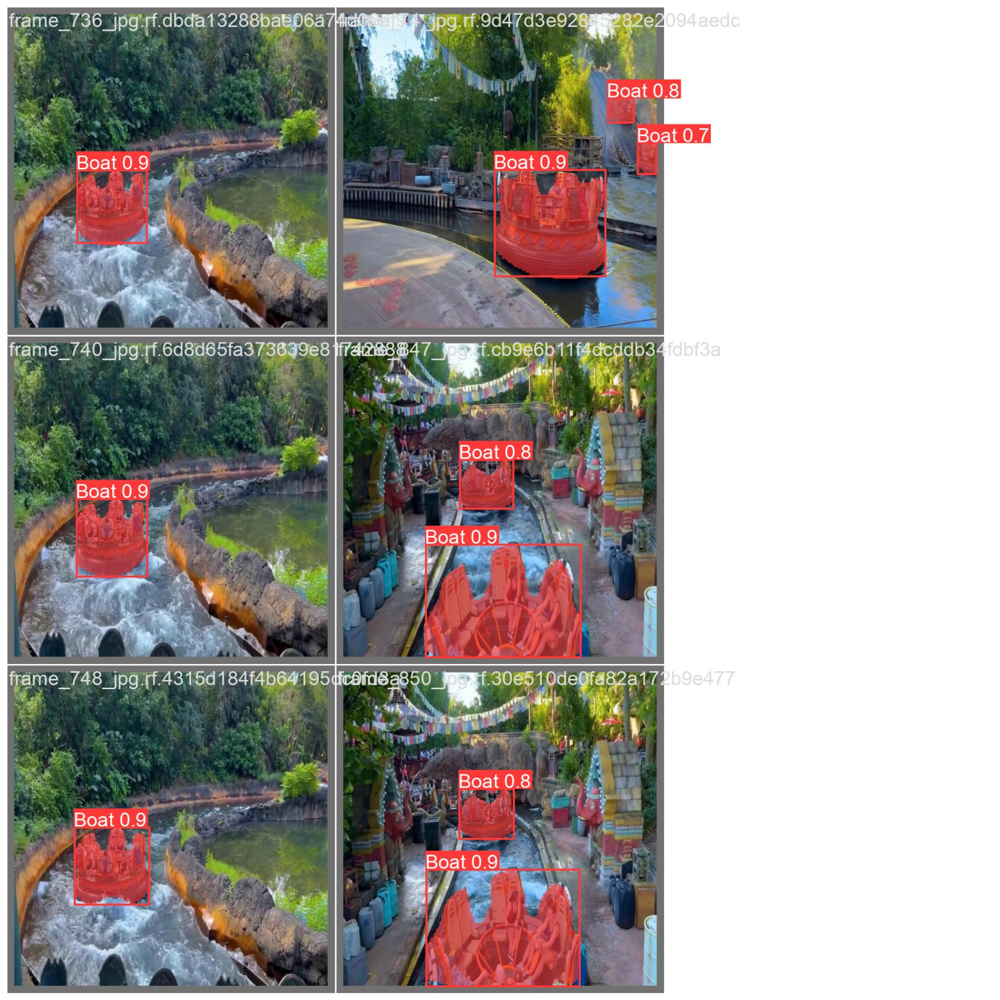

In [13]:
image_path = '/kaggle/working/Segmentation-2/runs/segment/Boat_Segmentation_S/val_batch1_pred.jpg'
visualize_image(image_path)

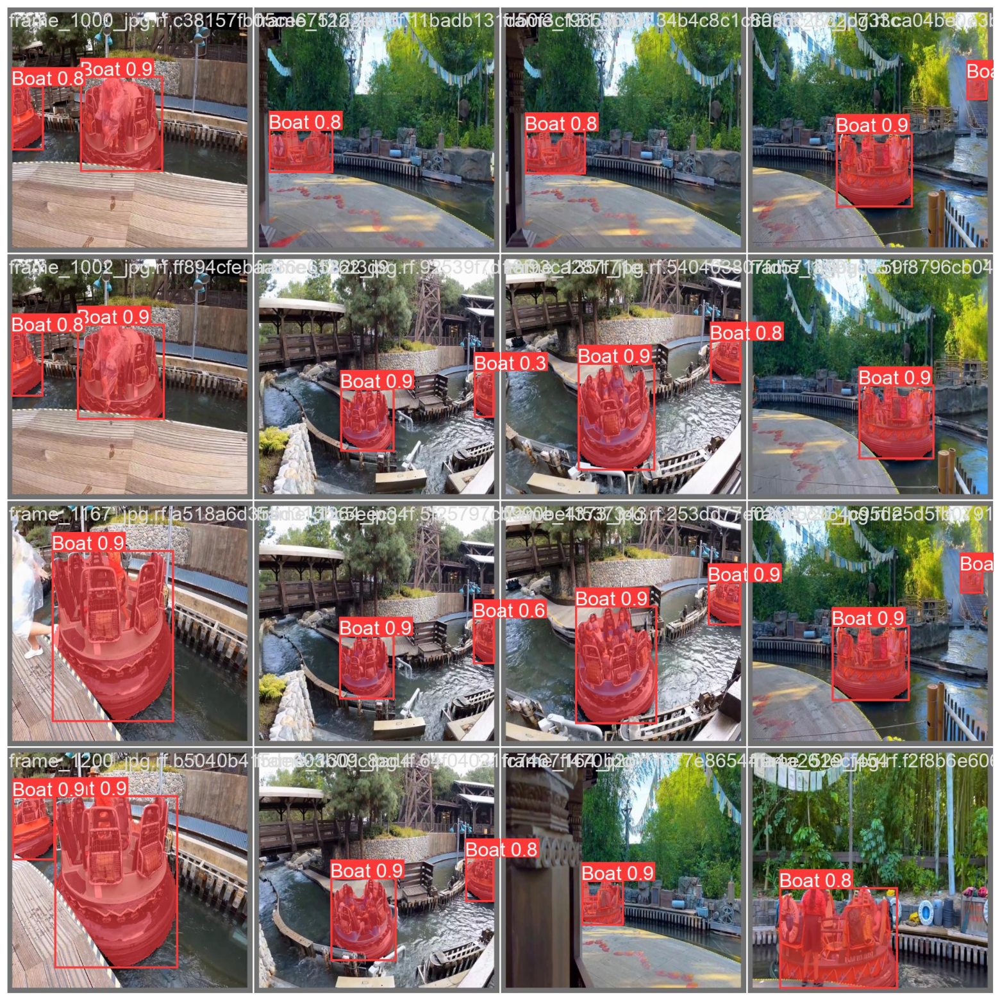

In [14]:
image_path = '/kaggle/working/Segmentation-2/runs/segment/Boat_Segmentation_S/val_batch0_pred.jpg'
visualize_image(image_path)

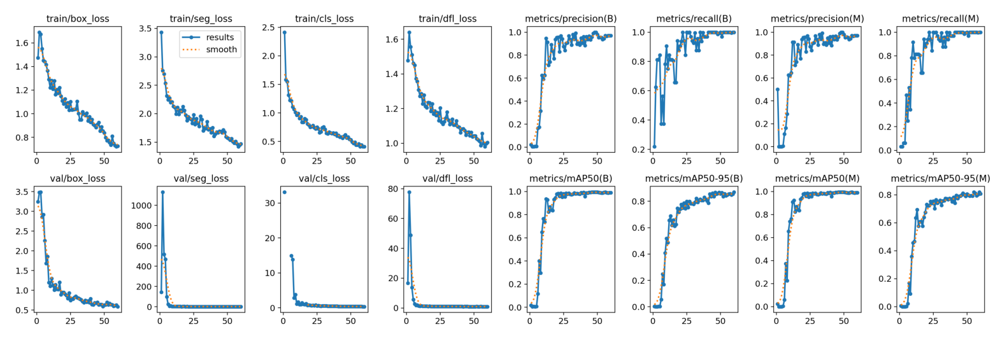

In [15]:
image_path = '/kaggle/working/Segmentation-2/runs/segment/Boat_Segmentation_S/results.png'
visualize_image(image_path)

The Losses are looking pretty god

## Prediction on Video for testing how it performs

In [16]:
!yolo segment track model=/kaggle/working/Segmentation-2/runs/segment/Boat_Segmentation_S/weights/best.pt source='/kaggle/input/kali-test-2/kali_test_2.mp4'

requirements: Ultralytics requirement ['lapx>=0.5.2'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 27.8 MB/s eta 0:00:00 0:00:01

requirements: AutoUpdate success ✅ 11.5s, installed 1 package: ['lapx>=0.5.2']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

Ultralytics YOLOv8.2.24 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs

video 1/1 (frame 1/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 1 Boat, 79.2ms
video 1/1 (frame 2/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 1 Boat, 8.3ms
video 1/1 (frame 3/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 1 Boat, 8.7ms
video 1/1 (frame 4/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 1 Boat, 8.4ms
video 1/1 (frame 5/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 1 Boat, 8.9ms
video 1/1 (frame 6/1018) /kaggle/input/kali-test

# Let's see how it performed

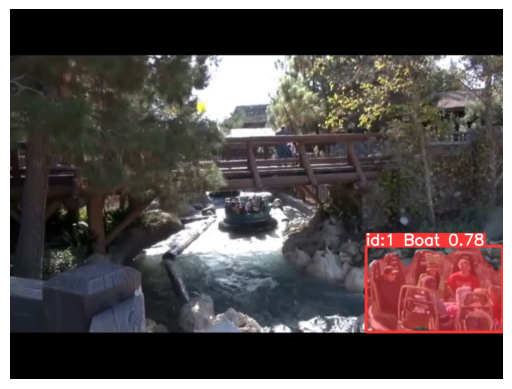

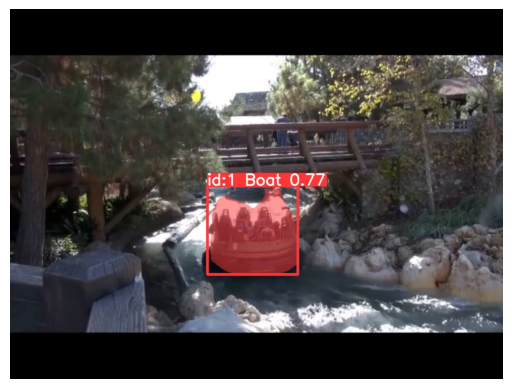

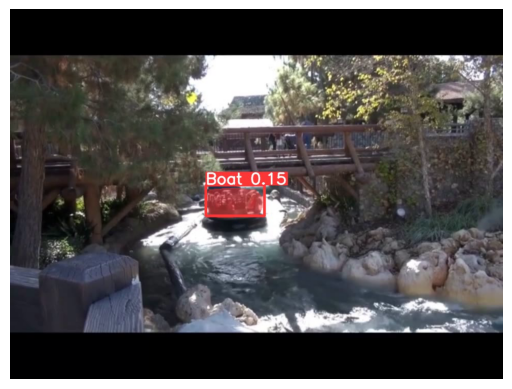

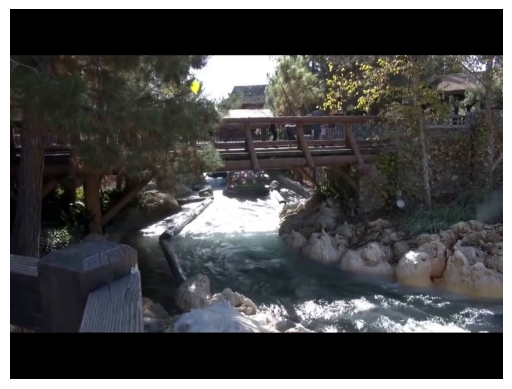

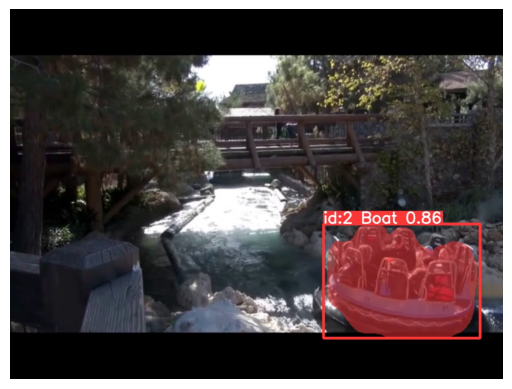

...

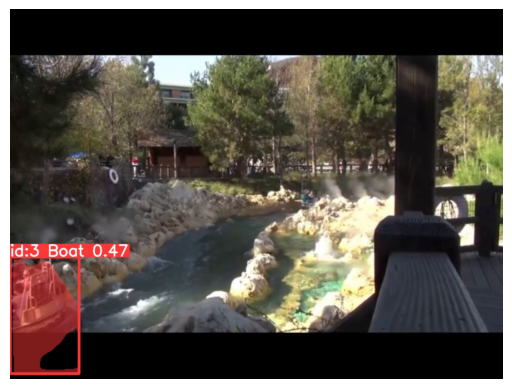

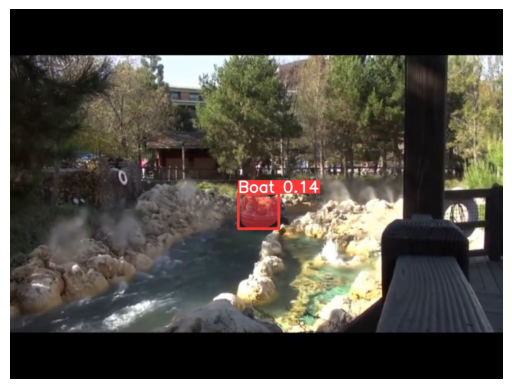

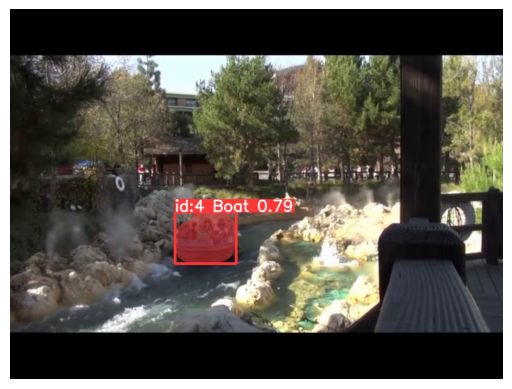

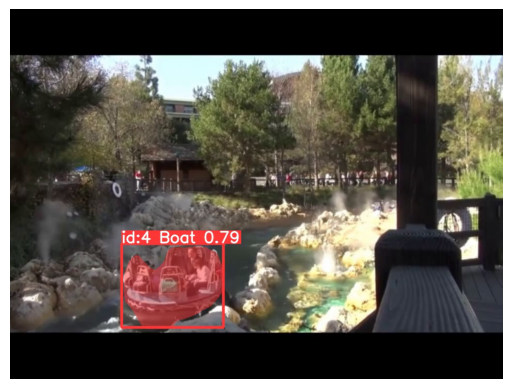

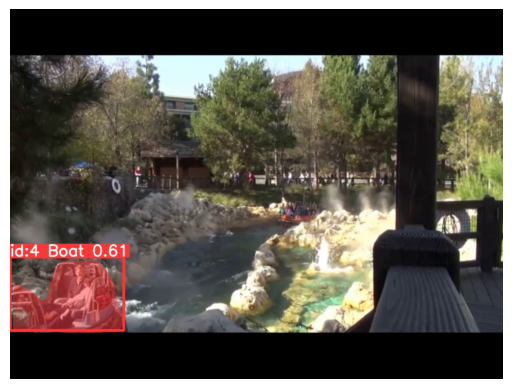

Failed to capture frame


In [27]:
import cv2
cap=cv2.VideoCapture('/kaggle/working/Segmentation-2/runs/segment/track/kali_test_2.avi')
count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        print("Failed to capture frame")
        break
    if(count%100==0):  # show only 50th frame
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imshow(frame)
        plt.axis('off')
        plt.show()  
    count += 1

cap.release()

In [ ]:
import cv2
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
color = (0, 0, 0)
thickness = 2

In [ ]:
# Load the two videos
video1 = cv2.VideoCapture('/kaggle/working/Segmentation-2/runs/segment/track7/kali_test_2.avi')
video2 = cv2.VideoCapture('/kaggle/working/Segmentation-2/runs/segment/track6/kali_test_2.avi')

# Get the frame width and height of the first video
frame_width1 = int(video1.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height1 = int(video1.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Create a new video writer object to write the combined video
video_writer = cv2.VideoWriter('combined_video_yolo6.avi',cv2.VideoWriter_fourcc(*'XVID'), 30, (frame_width1*2, frame_height1))
while True:
    # Read the next frame from each video
    ret1, frame1 = video1.read()
    ret2, frame2 = video2.read()

    # If we reached the end of either video, break out of the loop
    if not ret1 or not ret2:
        break

    # Resize the frames to the same size
    frame1 = cv2.resize(frame1, (frame_width1, frame_height1))
    frame2 = cv2.resize(frame2, (frame_width1, frame_height1))
    
    # Add text to each frame
    cv2.putText(frame1, "Yolov8s Avgrage Inference 15ms", (50, 150), font, font_scale, color, thickness, cv2.LINE_AA)
    cv2.putText(frame2, "Yolov8m Avgrage Inference 20ms", (50,150), font, font_scale, color, thickness, cv2.LINE_AA)
     # Combine the two frames side by side
    combined_frame = cv2.hconcat([frame1, frame2])

    # Write the combined frame to the new video
    video_writer.write(combined_frame)

# Release the video capture and writer objects
video1.release()
video2.release()
video_writer.release()